In [1]:
#Our aim is to classify images based on visual similarities

In [2]:
################## CMD_Unsupervised Learning#########
# For commands
import os
#os.chdir('/content/')
import time
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')
# For array manipulation
import numpy as np
import pandas as pd
import pandas.util.testing as tm
# For visualization
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import cv2
import imageio as io
from pylab import *
from sklearn.manifold import TSNE
#For model performance
from sklearn.metrics import pairwise_distances
from sklearn.metrics.pairwise import cosine_similarity
#from sklearn.externals import joblib
#For model training (ML modules)
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import tensorflow as tf
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential
from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, UpSampling2D
from keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam, Adagrad, RMSprop, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
from keras.models import load_model
from keras.preprocessing import image

In [3]:
# Giving the path to the file 
file_path = os.listdir('/Users/bishn/Desktop/ML/input_datasetsx/')
print (len(file_path))
# datasets is very small.

57


In [4]:
# Test_train_split
def shuffle_data (file_path):
    train_files, test_files = train_test_split(file_path, test_size = 0.2)
    return train_files, test_files
train_files, test_files = shuffle_data (file_path)
print(len(train_files))
print(len(test_files))

train_files = pd.DataFrame(train_files,columns=['filepath'])
test_files = pd.DataFrame(test_files,columns=['filepath'])
#converting into .csv file for future reference.
train_files.to_csv('/Users/bishn/Desktop/ML/input_datasetsx/train_file.csv')
test_files.to_csv('/Users/bishn/Desktop/ML/input_datasetsx/test_file.csv')

45
12


In [5]:
#loading csv files. 
train_files = list(pd.read_csv('/Users/bishn/Desktop/ML/input_datasetsx/train_file.csv')['filepath'])
test_files = list(pd.read_csv('/Users/bishn/Desktop/ML/input_datasetsx/test_file.csv')['filepath'])
print (train_files)
print (test_files)

['NGC_6397_a_b.csv_DR3.png', 'NGC_6171_a_b.csv_DR3.png', 'NGC_5904_a_b.csv_DR3.png', 'NGC_4833_a_b.csv_DR3.png', 'NGC_6362_a_b.csv_DR3.png', 'NGC_288_a_b.csv_DR3.png', 'NGC_6934_a_b.csv_DR3.png', 'NGC_6717_a_b.csv_DR3.png', 'NGC_6352_a_b.csv_DR3.png', 'NGC_6121_a_b.csv_DR3.png', 'NGC_6809_a_b.csv_DR3.png', 'NGC_6712_a_b.csv_DR3.png', 'Rup_106_a_b.csv_DR3.png', 'NGC_5053_a_b.csv_DR3.png', 'NGC_6760_a_b.csv_DR3.png', 'NGC_6535_a_b.csv_DR3.png', 'IC_4499_a_b.csv_DR3.png', 'NGC_6333_a_b.csv_DR3.png', 'NGC_6624_a_b.csv_DR3.png', 'NGC_5272_a_b.csv_DR3.png', 'NGC_6496_a_b.csv_DR3.png', 'NGC_6656_a_b.csv_DR3.png', 'NGC_2298_a_b.csv_DR3.png', 'NGC_6752_a_b.csv_DR3.png', 'NGC_5139_a_b.csv_DR3.png', 'NGC_6723_a_b.csv_DR3.png', 'NGC_6235_a_b.csv_DR3.png', 'NGC_5024_a_b.csv_DR3.png', 'NGC_362_a_b.csv_DR3.png', 'NGC_6541_a_b.csv_DR3.png', 'NGC_5466_a_b.csv_DR3.png', 'NGC_6254_a_b.csv_DR3.png', 'NGC_6779_a_b.csv_DR3.png', 'NGC_6218_a_b.csv_DR3.png', 'NGC_6681_a_b.csv_DR3.png', 'NGC_6539_a_b.csv_DR3.p

(600, 600, 3)


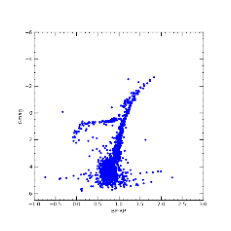

In [6]:
# loading any image to check
img = cv2.imread('/Users/bishn/Desktop/ML/input_datasetsx/' + train_files[25])
print (img.shape)
img = cv2.resize (img, (224, 224))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.axis ('off')
plt.imshow(img)


In [7]:
###Reading images 
def image2array(file_array):
    image_array = []
    for path in tqdm(file_array):
        img = cv2.imread('/Users/bishn/Desktop/ML/input_datasetsx/'+path)
        # Convert it from BGR to RGB so we can plot them later (because openCV reads images as BGR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert to RGB
        #Loaded images are resized to 224 x 224 before storing them in our array since this is the size preferred by VGG19
        img = cv2.resize(img, (224,224))
        image_array.append(np.array(img))
    image_array = np.array(image_array)
    image_array = image_array.reshape(image_array.shape[0], 224, 224, 3) 
    image_array = image_array.astype('float32')
    # Normalized
    image_array /= 255 
    return np.array(image_array)

In [8]:
# Test_train_shape # Make sure datasets only contain images(jpeg, png, jpg), not pdf file images
train_data = image2array(train_files)
print("Length of training dataset:",train_data.shape)
test_data = image2array(test_files)
print("Length of test dataset:",test_data.shape)


Length of training dataset: (45, 224, 224, 3)



Length of test dataset: (12, 224, 224, 3)


#Model Architecture and Model Training

# Encoder and decoder # Using activation function relu
def encoder_decoder_model():
    #Encoder 
    model = Sequential(name='Convolutional_AutoEncoder_Model')
    model.add(Conv2D(64, kernel_size=(3, 3),activation='relu',input_shape=(224, 224, 3),padding='same', name='Encoding_Conv2D_1'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_1'))
    model.add(Conv2D(128, kernel_size=(3, 3),strides=1,kernel_regularizer = tf.keras.regularizers.L2(0.001),activation='relu',padding='same', name='Encoding_Conv2D_2'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_2'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu',kernel_regularizer= tf.keras.regularizers.L2(0.001), padding='same', name='Encoding_Conv2D_3'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_3'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu',kernel_regularizer= tf.keras.regularizers.L2(0.001), padding='same', name='Encoding_Conv2D_4'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2,padding='valid', name='Encoding_MaxPooling2D_4'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_5'))
    model.add(MaxPooling2D(pool_size=(2,2), strides=2, padding='valid'))
    
    #Decoder
    model.add(Conv2D(512, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001),activation='relu', padding='same', name='Decoding_Conv2D_1'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsamping2D_1'))
    model.add(Conv2D(512, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001), activation='relu', padding='same', name='Decoding_Conv2D_2'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsamping2D_2'))
    model.add(Conv2D(256, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001), activation='relu', padding='same',name='Decoding_Conv2D_3'))
    model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_3'))
    model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L2(0.001), padding='same',name='Decoding_Conv2D_4'))
    model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_4'))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L2(0.001), padding='same',name='Decoding_Conv2D_5'))
    model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_5'))
    model.add(Conv2D(3, kernel_size=(3, 3), padding='same',activation='sigmoid',name='Decoding_Output'))
    return model

In [13]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D

def encoder_decoder_model():
    # Encoder
    model = Sequential(name='Convolutional_AutoEncoder_Model')
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3), padding='same', name='Encoding_Conv2D_1'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_1'))
    model.add(Conv2D(128, kernel_size=(3, 3), strides=1, activation='relu', padding='same', name='Encoding_Conv2D_2'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_2'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_3'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_3'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_4'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', name='Encoding_MaxPooling2D_4'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_5'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid'))

    # Decoder
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', name='Decoding_Conv2D_1'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsampling2D_1'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', name='Decoding_Conv2D_2'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsampling2D_2'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same', name='Decoding_Conv2D_3'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsampling2D_3'))
    model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same', name='Decoding_Conv2D_4'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsampling2D_4'))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same', name='Decoding_Conv2D_5'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsampling2D_5'))
    model.add(Conv2D(3, kernel_size=(3, 3), activation='sigmoid', padding='same', name='Decoding_Output'))
    return model


In [14]:
model = encoder_decoder_model()
model.summary()
print("\n")
tf.keras.utils.plot_model(model, to_file='/home/bishnu/Desktop/ML/CMD_Absolutemag/model.png')

Model: "Convolutional_AutoEncoder_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Encoding_Conv2D_1 (Conv2D)  (None, 224, 224, 64)      1792      
                                                                 
 Encoding_MaxPooling2D_1 (Ma  (None, 112, 112, 64)     0         
 xPooling2D)                                                     
                                                                 
 Encoding_Conv2D_2 (Conv2D)  (None, 112, 112, 128)     73856     
                                                                 
 Encoding_MaxPooling2D_2 (Ma  (None, 56, 56, 128)      0         
 xPooling2D)                                                     
                                                                 
 Encoding_Conv2D_3 (Conv2D)  (None, 56, 56, 256)       295168    
                                                                 
 Encoding_MaxPooling2D_3 (Ma  (None

In [15]:
parameters = {'Adagrad':[0.01,0.001, 0.0001, 0.00001],'Adam':[0.01,0.001, 0.0001, 0.00001],'Rmsprop':[0.01,0.001, 0.0001, 0.00001]}
result = []
for i in parameters.keys():
    print("{} as an optimizer:".format(i))
    values = parameters[i]
    result_ = []
    for learning_rate in values:
        print("\t\tUsing learning_rate: "+str(learning_rate))
        model = encoder_decoder_model()
        if i=='Adam':
            optimizer = Adam(learning_rate=learning_rate)
        elif i=='Adagrad':
            optimizer = Adagrad(learning_rate=learning_rate)
        else:
            optimizer = RMSprop(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss= 'mse')             # compiling 
        model.fit(train_data, train_data, epochs= 1, batch_size=10,validation_data=(test_data,test_data))  # fitting data
        result_.append(model.history.history)           # taking result to judge the best parameters.
    print()
    result.append(result_)

Adagrad as an optimizer:
		Using learning_rate: 0.01
5/5 [==============================] - 15s 3s/step - loss: 0.2426 - val_loss: 0.2373
		Using learning_rate: 0.001
5/5 [==============================] - 21s 4s/step - loss: 0.2434 - val_loss: 0.2431
		Using learning_rate: 0.0001
5/5 [==============================] - 19s 3s/step - loss: 0.2441 - val_loss: 0.2444
		Using learning_rate: 1e-05
5/5 [==============================] - 16s 3s/step - loss: 0.2432 - val_loss: 0.2434

Adam as an optimizer:
		Using learning_rate: 0.01
5/5 [==============================] - 16s 3s/step - loss: 0.0751 - val_loss: 0.0249
		Using learning_rate: 0.001
5/5 [==============================] - 17s 3s/step - loss: 0.0974 - val_loss: 0.0249
		Using learning_rate: 0.0001
5/5 [==============================] - 18s 3s/step - loss: 0.1964 - val_loss: 0.0489
		Using learning_rate: 1e-05
5/5 [==============================] - 18s 3s/step - loss: 0.2427 - val_loss: 0.2381

Rmsprop as an optimizer:
		Using learni

In [16]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='r'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    
    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

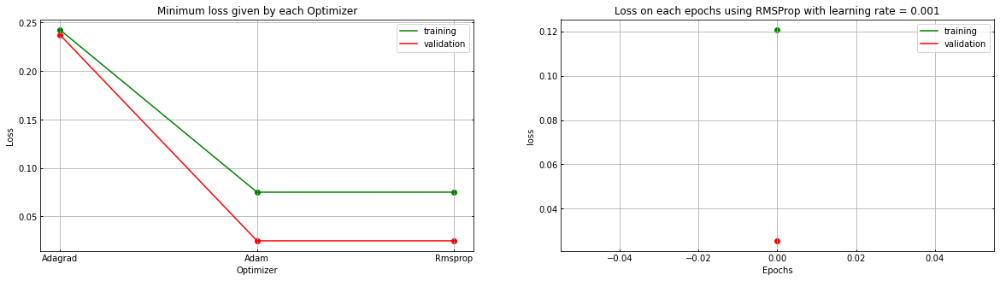

In [17]:
min_train = []; min_val = []  
rates = list(parameters.keys())
epochs = [0]
for i in result:
    train = []; val = []
    for j in i:
        train.append(min(j['loss'])); val.append(min(j['val_loss']))  # taking minimum loss of each optimizer over all learning rates.
    min_train.append(min(train)); min_val.append(min(val))
plt.figure(figsize=(20,5))
plot_(rates,min_train,min_val,1,2,1,'Minimum loss given by each Optimizer','Optimizer','Loss','training',False,'r')
plt.minorticks_off()
plt.tick_params(axis = 'y', which = 'minor', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'y', which = 'major', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'x', which = 'minor', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'x', which = 'major', length = 2.5, width = 1, direction = 'in', right = True)
#plot_(epochs, result[0][0]['loss'],result[0][0]['val_loss'],1,2,2,'Loss on each epochs using Adagrad with learning rate = 0.001','Epochs','loss','training',False,'r')
#plot_(epochs, result[1][1]['loss'],result[1][1]['val_loss'],1,2,2,'Loss on each epochs using Adam with learning rate = 0.001','Epochs','loss','training',False,'r')
plot_(epochs, result[2][2]['loss'],result[2][2]['val_loss'],1,2,2,'Loss on each epochs using RMSProp with learning rate = 0.001','Epochs','loss','training',False,'r')
plt.minorticks_off()
plt.tick_params(axis = 'y', which = 'minor', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'y', which = 'major', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'x', which = 'minor', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'x', which = 'major', length = 2.5, width = 1, direction = 'in', right = True)
plt.show()

# Min_delta : minimum change in the monitored quantity to qualify as an improvement, i.e. an absolute change of less than min_delta, will count as no improvement.
# Patience : number of epochs with no improvement after which training will be stopped.

In [18]:
optimizer = Adam(learning_rate=0.001) 
model = encoder_decoder_model() 
model.compile(optimizer=optimizer, loss='mse') 
early_stopping = EarlyStopping(monitor='val_loss', mode='min',verbose=1,patience=6,min_delta=0.0001) 
checkpoint = ModelCheckpoint('/Users/bishn/Desktop/ML/input_datasetsx/encoder_model.h5', monitor='val_loss', mode='min', save_best_only=True) 
history = model.fit(train_data, train_data, epochs=30, batch_size=32,validation_data=(test_data,test_data),callbacks=[early_stopping,checkpoint]) 

Epoch 1/30
2/2 [==============================] - 18s 7s/step - loss: 0.1817 - val_loss: 0.0249
Epoch 2/30
2/2 [==============================] - 18s 6s/step - loss: 0.0287 - val_loss: 0.0249
Epoch 3/30
2/2 [==============================] - 16s 5s/step - loss: 0.0287 - val_loss: 0.0249
Epoch 4/30
2/2 [==============================] - 16s 5s/step - loss: 0.0287 - val_loss: 0.0249
Epoch 5/30
2/2 [==============================] - 16s 6s/step - loss: 0.0287 - val_loss: 0.0249
Epoch 6/30
2/2 [==============================] - 16s 6s/step - loss: 0.0287 - val_loss: 0.0249
Epoch 7/30
2/2 [==============================] - 16s 5s/step - loss: 0.0287 - val_loss: 0.0249
Epoch 7: early stopping


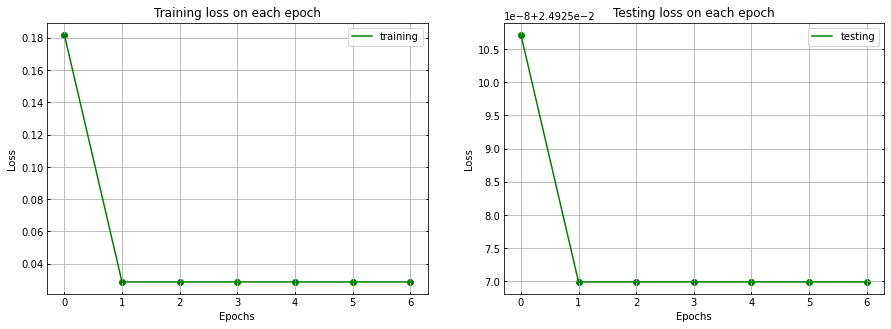

In [22]:
#model.history.history
plt.figure(figsize=(15,5))
epochs = [i for i in range(7)]
loss = history.history['loss']
val_loss = history.history['val_loss']
#loss = [178, 3]
#val_loss = [2.9290, 2.6709]
plot_(epochs,loss,'',1,2,1,'Training loss on each epoch','Epochs','Loss','training',False,'g')
plt.minorticks_off()
plt.tick_params(axis = 'y', which = 'minor', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'y', which = 'major', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'x', which = 'minor', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'x', which = 'major', length = 2.5, width = 1, direction = 'in', right = True)
plot_(epochs,val_loss,'',1,2,2,'Testing loss on each epoch','Epochs','Loss','testing',False,'r')
plt.minorticks_off()
plt.tick_params(axis = 'y', which = 'minor', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'y', which = 'major', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'x', which = 'minor', length = 2.5, width = 1, direction = 'in', right = True)
plt.tick_params(axis = 'x', which = 'major', length = 2.5, width = 1, direction = 'in', right = True)
plt.show ()

model.history.history
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.plot(epochs, loss, 'bo', 1,2,1, label='Training loss')
plt.plot(epochs, val_loss, 'r', 1,2,2, label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.xlabel ('Epochs')
plt.ylabel ('Loss')
#plt.figure (figsize= (7,7))
plt.figure()


#plt.figure (figsize= (7,7))
# The loss is significantly decreasing as long as  epochs is increasing 

In [23]:
#load model
model = load_model('/Users/bishn/Desktop/ML/input_datasetsx/encoder_model.h5')
model.compile(optimizer=optimizer, loss='mse') 

1/1 [==============================] - 0s 113ms/step


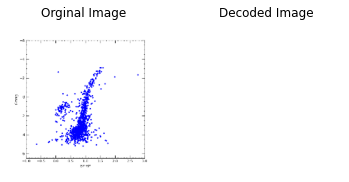

In [25]:
sample_image = train_data[17]
sample_image = np.expand_dims(sample_image,axis=0)
image = model.predict(sample_image)
plot_(sample_image[0,:,:,:],'','',1,2,1,"Orginal Image","","","",True)
plot_(image[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

1/1 [==============================] - 0s 124ms/step


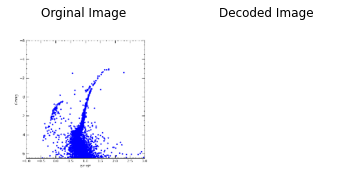

In [26]:
sample_image = train_data[23]
sample_image = np.expand_dims(sample_image,axis=0)
image = model.predict(sample_image)
plot_(sample_image[0,:,:,:],'','',1,2,1,"Orginal Image","","","",True)
plot_(image[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

1/1 [==============================] - 0s 182ms/step


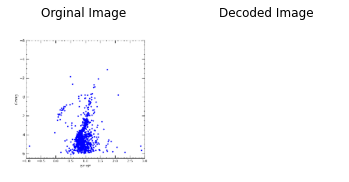

In [27]:
model = load_model('/Users/bishn/Desktop/ML/input_datasetsx/encoder_model.h5')
sample_image = train_data[15]
sample_image = np.expand_dims(sample_image,axis=0)
image = model.predict(sample_image)
plot_(train_data[15],'','',1,2,1,"Orginal Image","","","",True)
plot_(image[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

In [28]:
from keras import backend as K 
def feature_extraction(model, data, layer = 4):

    encoded = K.function([model.layers[0].input],[model.layers[layer].output])
    encoded_array = encoded([data])[0]
    pooled_array = encoded_array.max(axis=-1)
    return encoded_array
encoded = feature_extraction(model,train_data[:10],4)

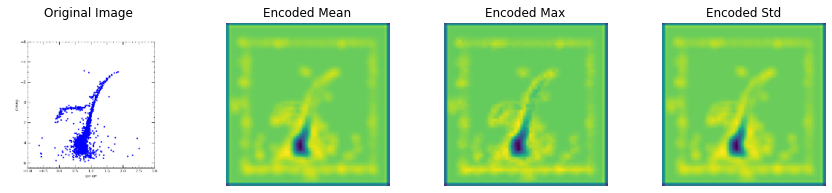

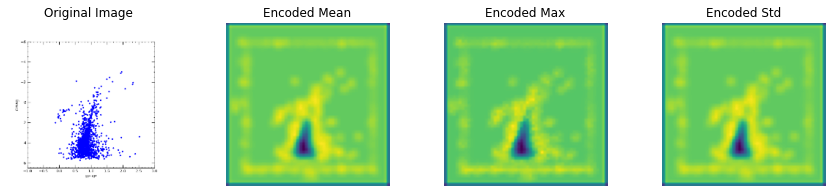

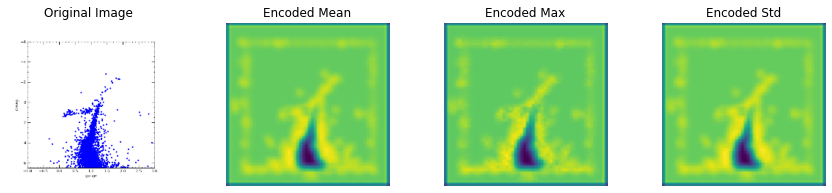

In [29]:
for index in [2,7,9]:   # 3 random images
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded[index].mean(axis=-1),'','',1,4,2,"Encoded Mean","","",'',True)
    plot_(encoded[index].max(axis=-1),'','',1,4,3,"Encoded Max","","",'',True)
    plot_(encoded[index].std(axis=-1),'','',1,4,4,"Encoded Std","","",'',True)
    plt.show()

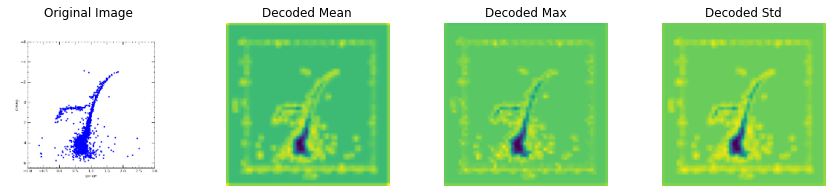

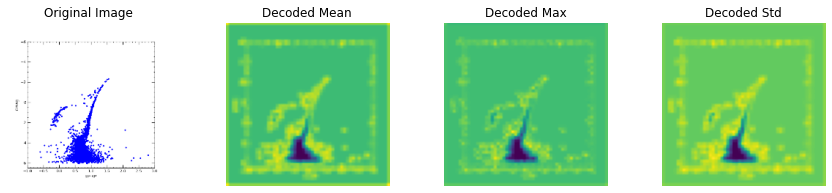

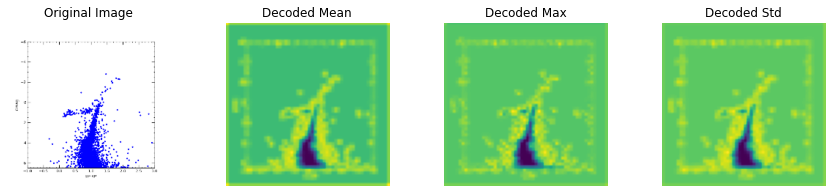

In [30]:
encoded = feature_extraction(model,train_data[:10],3) # 15 means 15 images at a time
for index in [2,5,9]:   # 3 random images, image number 12, 7, 9
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded[index].mean(axis=-1),'','',1,4,2,"Decoded Mean","","",'',True)
    plot_(encoded[index].max(axis=-1),'','',1,4,3,"Decoded Max","","",'',True)
    plot_(encoded[index].std(axis=-1),'','',1,4,4,"Decoded Std","","",'',True)
    plt.show()

In [32]:
def get_batches(data, batch_size=10):

    if len(data) < batch_size:
        return [data]
    n_batches = len(data) // batch_size
    
    # If batches fit exactly into the size of df.
    if len(data) % batch_size == 0:
        return [data[i*batch_size:(i+1)*batch_size] for i in range(n_batches)]   

    # If there is a remainder.
    else:
        return [data[i*batch_size:min((i+1)*batch_size, len(data))] for i in range(n_batches+1)]

In [33]:
d = np.concatenate([train_data,test_data],axis=0)
d.shape

(57, 224, 224, 3)

In [34]:
X_encoded = []
i=0
# Iterate through the full training set.
for batch in get_batches(d, batch_size=10):
    i+=1
    # This line runs our pooling function on the model for each batch.
    X_encoded.append(feature_extraction(model, batch))
    
X_encoded = np.concatenate(X_encoded)

In [35]:
X_encoded.shape 

(57, 56, 56, 256)

In [36]:
X_encoded_reshape = X_encoded.reshape(X_encoded.shape[0], X_encoded.shape[1]*X_encoded.shape[2]*X_encoded.shape[3])
print('Encoded shape:', X_encoded_reshape.shape)
np.save('/Users/bishn/Desktop/ML/input_datasetsx/encoder_model.h5','X_encoded_compressed.npy',X_encoded_reshape)

Encoded shape: (57, 802816)


In [37]:
lisp=train_files
lisp.extend(test_files)
print(len(lisp))

69


In [42]:
from sklearn.manifold import TSNE

transform = TSNE
trans = transform(n_components=2) 
values = trans.fit_transform(X_encoded_reshape) 

In [43]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='b'):

    
    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)


In [44]:
lisp=train_files
lisp.extend(test_files)
print(len(lisp))

81


In [45]:
#pip install threadpoolctl

## Elbow method 
- Elbow method is one of the most popular method used to select the optimal number of clusters by fitting the model with a range of values for K in K-means algorithm.
- SSE on y-axis and number of clusters on x-axis.

- 
## Error Sum of Squares (SSE)
- SSE is the sum of the squared differences between each observation and its group's mean. It can be used as a measure of variation within a cluster. If all cases within a cluster are identical the SSE would then be equal to 0. \\\
$SSE = \sum_{i = 1 }^{n} (X_{i}- X\bar)^{2}$

In [46]:
#   Sum_of_squared_distances = []
#    K = range(1,50)
#    for k in K:
#        km = KMeans(n_clusters=k)
#        km = km.fit(X_encoded_reshape)
#        Sum_of_squared_distances.append(km.inertia_)
#    plt.plot(K, Sum_of_squared_distances, 'bx-')
#    plt.xlabel('k')
#    plt.ylabel('Sum_of_squared_distances')
#    plt.title('Elbow Method For Optimal k')
#    plt.show()

In [47]:
#    from sklearn.metrics import mean_squared_error
#    sse = []
#    k_rng = range(1, 50)
#    for k in k_rng:
#        km = KMeans (n_clusters=k)
#        km.fit(X_encoded_reshape)
#        sse.append (km.inertia_)
#    plt.xlabel ('K')
#    plt.ylabel (' Sum of squared distances')
#    plt.plot (k_rng, sse)

if Number of clusters: 27


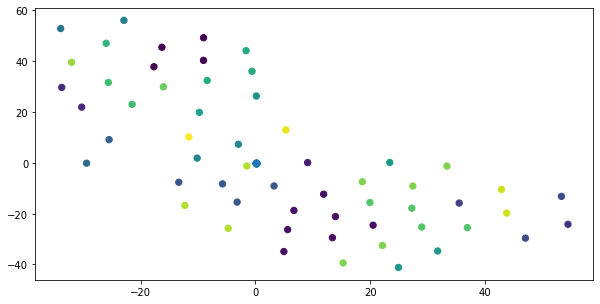

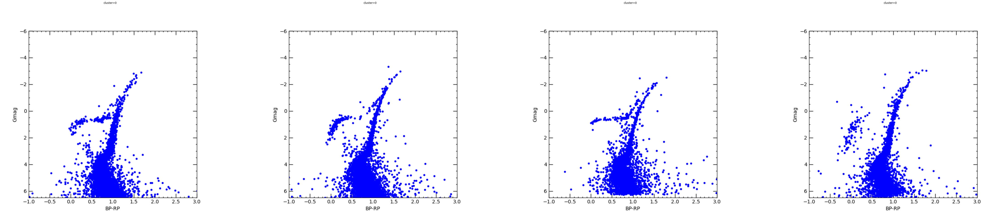

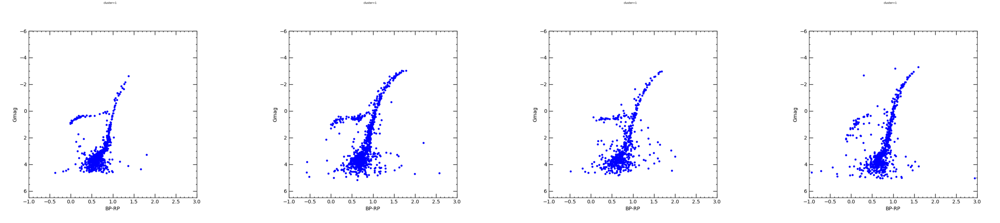

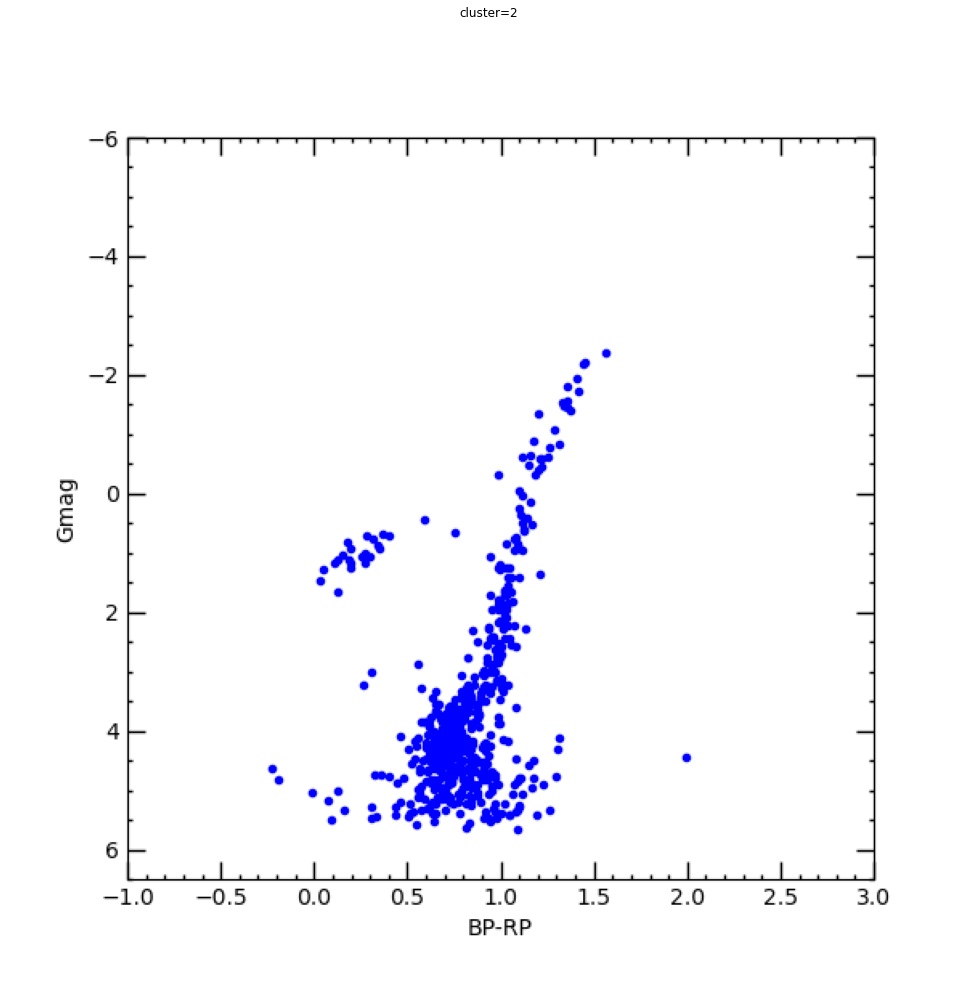

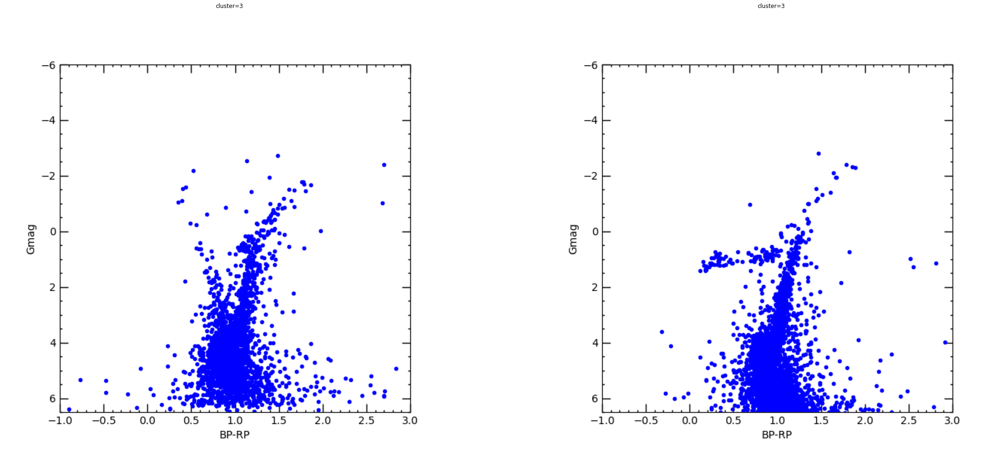

...

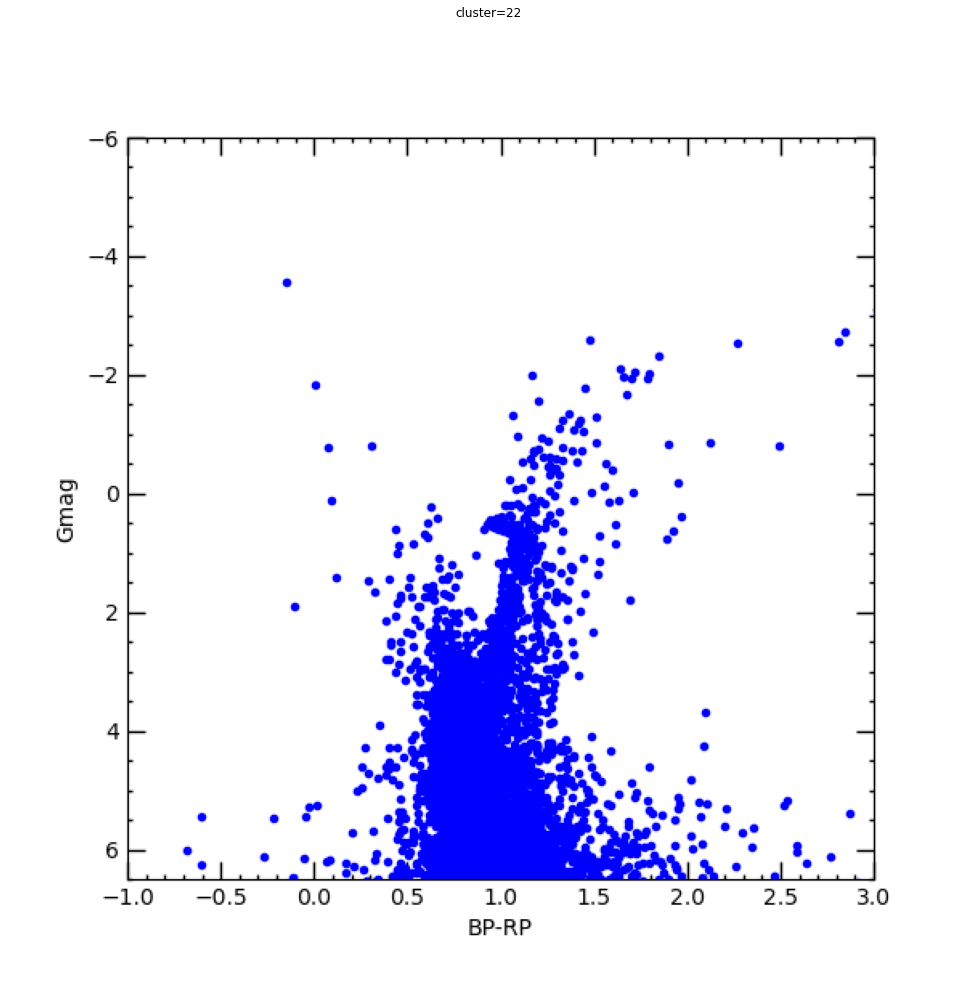

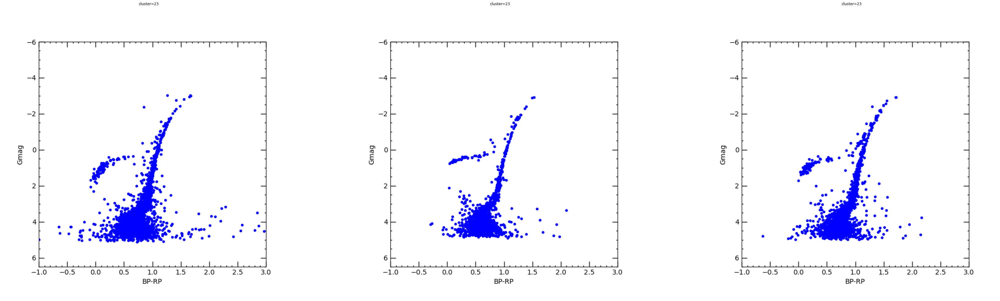

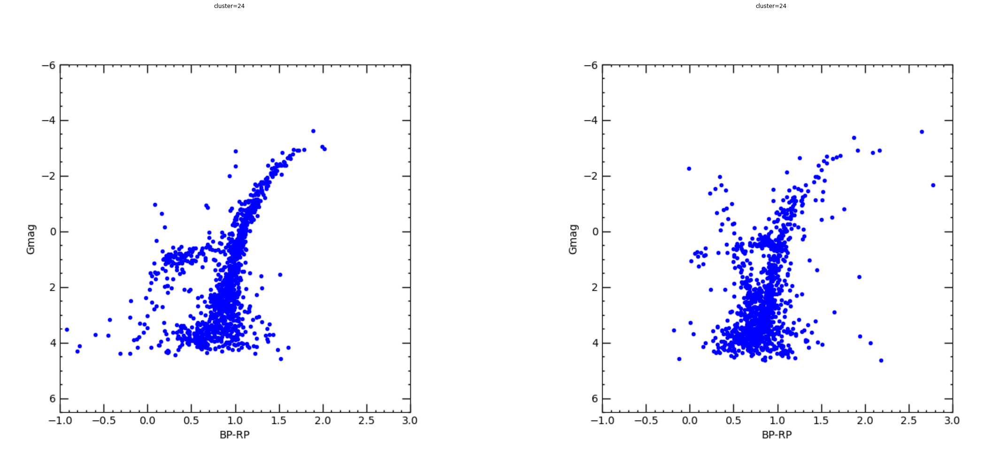

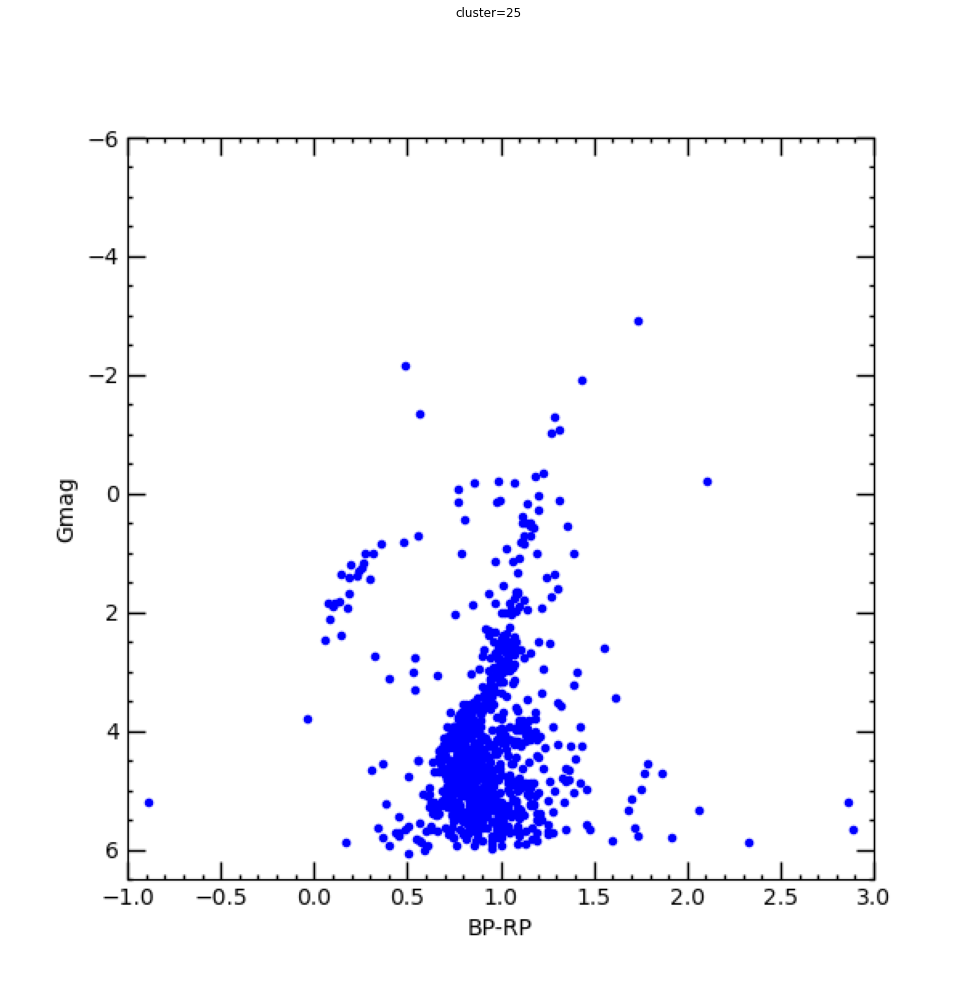

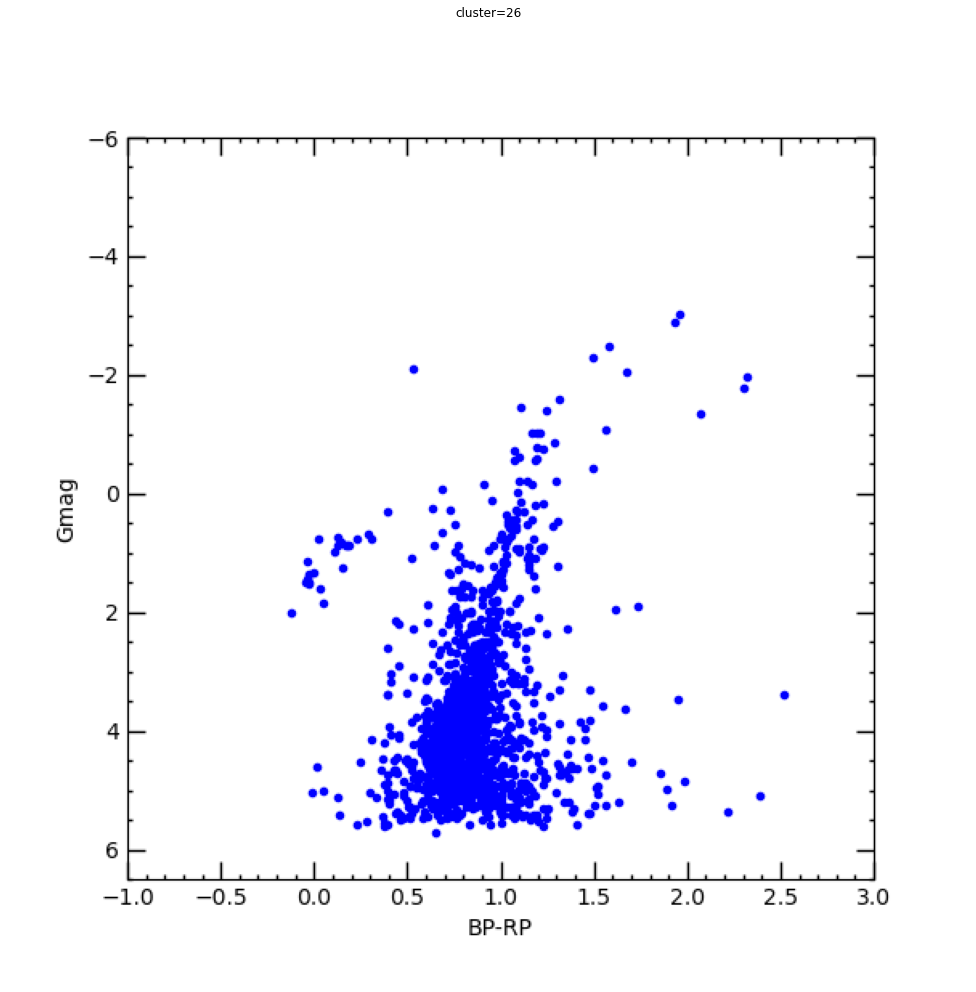

In [48]:
K = [27]
for k in K:
    print("if Number of clusters: "+str(k))
    kmeans = KMeans(n_clusters = k, random_state=0).fit(X_encoded_reshape)
    labels =  kmeans.labels_
    centroids = kmeans.cluster_centers_
    plt.figure(figsize=(10,5)) 
    plt.subplot(1,1,1)
    plt.scatter(values[:,0], values[:,1], c= kmeans.labels_.astype(float), s=40, alpha= 1)
    plt.scatter(centroids[:, 0], centroids[:, 1], c=None, s=40)
    plt.show()
    for row in range(k): 
        iter=0
        plt.figure(figsize=(100,50)) # Expand the figure size 
        for i,iterator in enumerate(labels):
            if iterator ==  row:
                img = cv2.imread("/Users/bishn/Desktop/ML/input_datasetsx/"+lisp[i])
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # changing image to RGB
                plot_(img,"","",1,5,iter+1,"cluster="+str(row),"","","",True)
                iter+=1
            if iter>=4: break
        plt.show()
    print() 

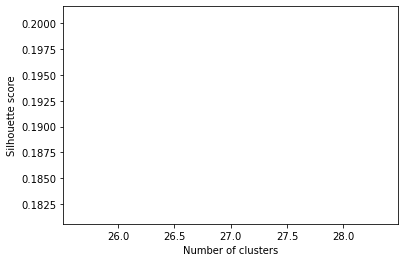

Optimal number of clusters: 2


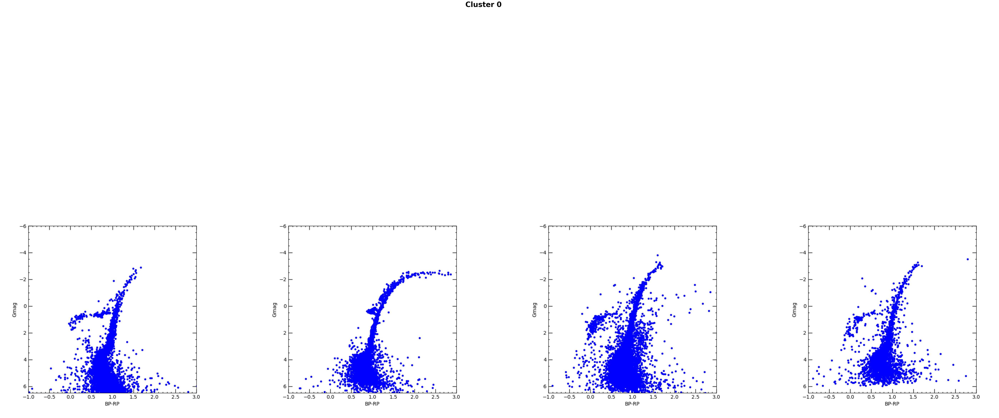

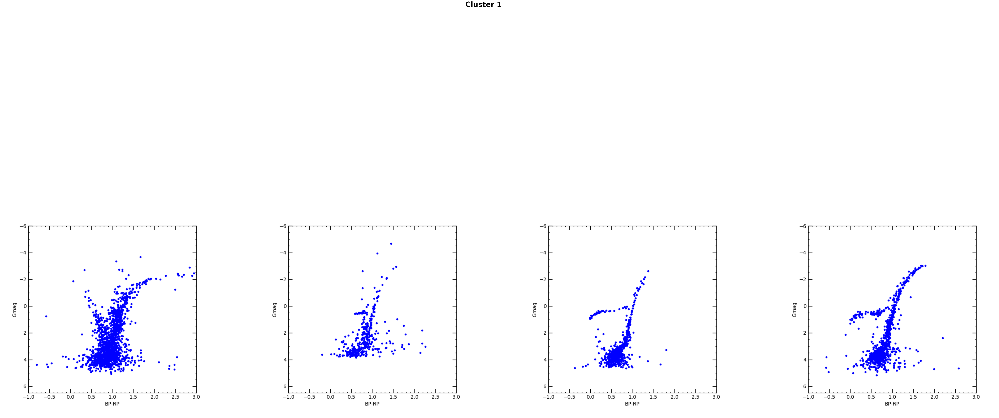

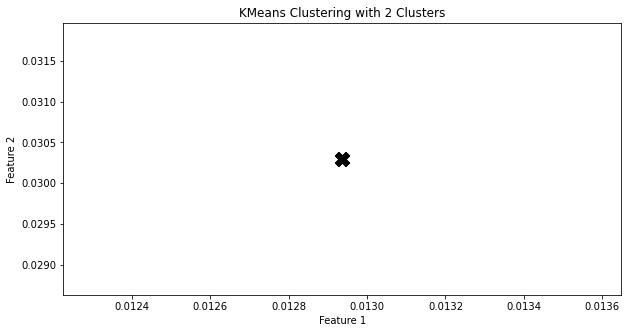

In [65]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
import cv2
import matplotlib.pyplot as plt

# load data
#X_encoded_reshape = ... # replace with your data
#lisp = ... # replace with your image names

# evaluate clustering with different number of clusters
scores = []
K = [27]
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X_encoded_reshape)
    score = silhouette_score(X_encoded_reshape, kmeans.labels_)
    scores.append(score)

# plot silhouette scores
plt.plot(k, scores)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()

# cluster data with optimal number of clusters
optimal_k = np.argmax(scores) + 2
print('Optimal number of clusters:', optimal_k)
kmeans = KMeans(n_clusters=optimal_k, random_state=0).fit(X_encoded_reshape)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# plot scatter plot and images for each cluster
for row in range(optimal_k):
    iter = 0
    plt.figure(figsize=(100, 50))
    for i, iterator in enumerate(labels):
        if iterator == row:
            img = cv2.imread("/Users/bishn/Desktop/ML/input_datasetsx/" + lisp[i])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(1, 4, iter + 1)
            plt.imshow(img)
            plt.axis('off')
            iter += 1
        if iter >= 4:
            break
    plt.suptitle("Cluster " + str(row), fontsize=40, fontweight='bold')
    plt.show()

# plot scatter plot with centroids
plt.figure(figsize=(10, 5))
plt.scatter(X_encoded_reshape[:, 0], X_encoded_reshape[:, 1], c=labels.astype(float), s=40, alpha=1)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=200, marker='X')
plt.title('KMeans Clustering with ' + str(optimal_k) + ' Clusters')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()


In [49]:
#Training the model with optimial K value (10 in our case)
kmeans = KMeans(n_clusters = 5, random_state=0).fit(X_encoded_reshape)
labels=kmeans.labels_
centroids = kmeans.cluster_centers_

In [50]:
import joblib
kmeans_file = '/Users/bishn/Desktop/ML/input_datasetsx/kmeans_model.pkl'
joblib.dump(kmeans,kmeans_file)

['/Users/bishn/Desktop/ML/input_datasetsx/kmeans_model.pkl']

In [51]:
clusters_features = []
cluster_files=[]
for i in [0,1,2,3,4]:
    i_cluster = []
    i_labels=[]
    for iter,j in enumerate(kmeans.labels_):
        if j==i:
            i_cluster.append(X_encoded_reshape[iter])
            i_labels.append(lisp[iter])
    i_cluster = np.array(i_cluster)
    clusters_features.append(i_cluster)
    cluster_files.append(i_labels)

In [52]:
labels=[]
data=[]
files=[]
for iter,i in enumerate(clusters_features):
    data.extend(i)
    labels.extend([iter for i in range(i.shape[0])])
    files.extend(cluster_files[iter])
print(np.array(labels).shape)
print(np.array(data).shape)
print(np.array(files).shape)

(57,)
(57, 802816)
(57,)


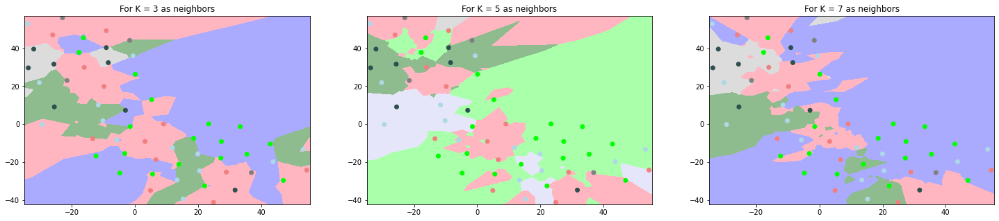

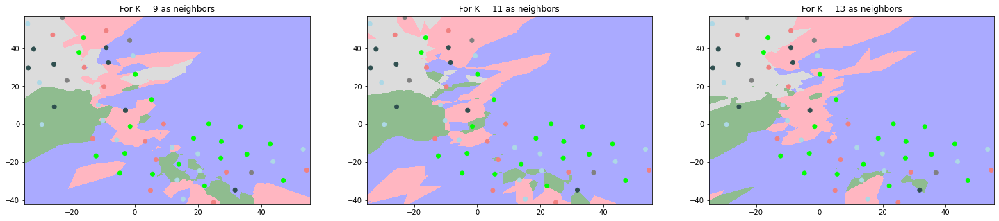

In [53]:
from matplotlib.colors import ListedColormap
for i in [[3,5,7],[9,11,13]]:
    plt.figure(figsize=(25,5))
    for iter,j in enumerate(i):
        n_neighbors = j
        X = values  
        y = labels
        h = .09  # step size in the mesh
        cmap_light = ListedColormap(['#FFB6C1', '#AAFFAA', '#AAAAFF','#E6E6FA','#8FBC8F','#DCDCDC'])
        cmap_bold = ListedColormap(['#F08080', '#00FF00', '#0000FF','#ADD8E6','#2F4F4F','#808080'])
        clf = KNeighborsClassifier(n_neighbors)
        clf.fit(X, y)

        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1 
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1 
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

        plt.subplot(1,3,iter+1)
        Z = Z.reshape(xx.shape)
        plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

        # Plot also the training points 
        plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold)
        plt.xlim(xx.min(), xx.max())
        plt.ylim(yy.min(), yy.max())
        plt.title("For K = {} as neighbors".format(j))
    plt.show() 

In [54]:
knn = KNeighborsClassifier(n_neighbors=7,algorithm='ball_tree',n_jobs=-1)
knn.fit(np.array(data),np.array(labels))

KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=7)

In [55]:
knn_file = '/Users/bishn/Desktop/ML/input_datasetsx/kmeans_model.pkl'
joblib.dump(knn,knn_file)

['/Users/bishn/Desktop/ML/input_datasetsx/kmeans_model.pkl']

In [56]:
def results_(query,result):
    def read(img):
        image = cv2.imread("/Users/bishn/Desktop/ML/input_datasetsx/"+img)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        return image
    plt.figure(figsize=(10,5))
    if type(query)!=type(30):
        plot_(query,"","",1,1,1,"Query Image","","","",True)
    else:
        plot_(read(files[query]),"","",1,1,1,"Query Image "+files[query],"","","",True)
    plt.show()
    plt.figure(figsize=(20,5))
    for iter,i in enumerate(result):
        plot_(read(files[i]),"","",1,len(result),iter+1,files[i],"","","",True)
    plt.show()

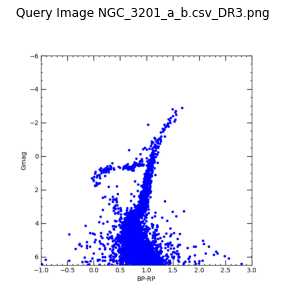

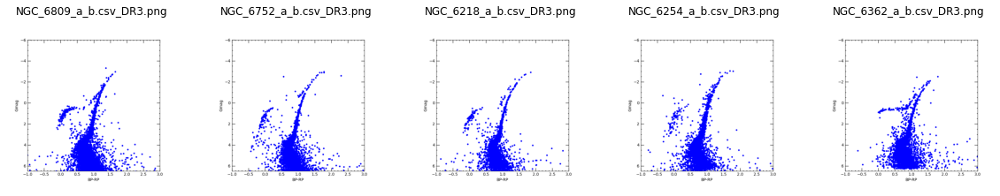

In [57]:
num = 0#datapoint
res = knn.kneighbors(data[num].reshape(1,-1),return_distance=True,n_neighbors=6)
results_(num,list(res[1][0])[1:])

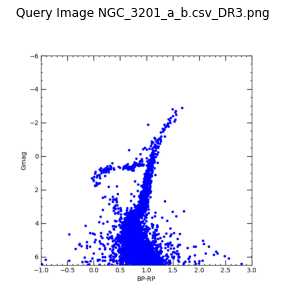

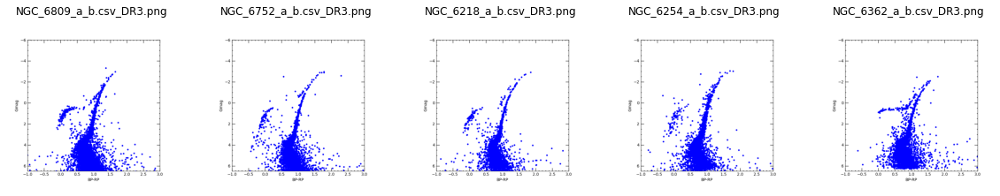

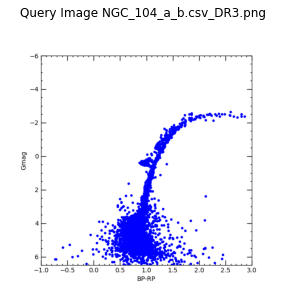

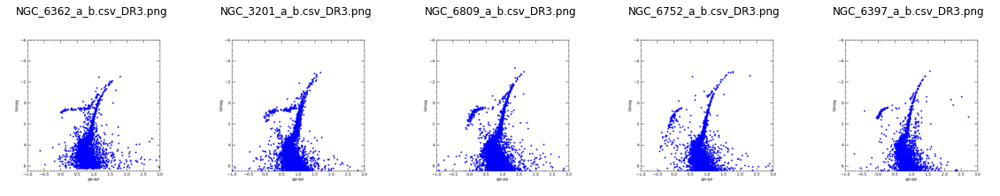

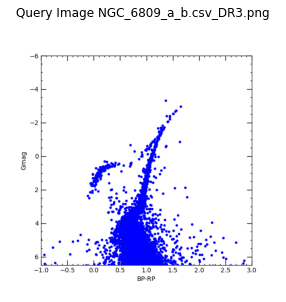

...

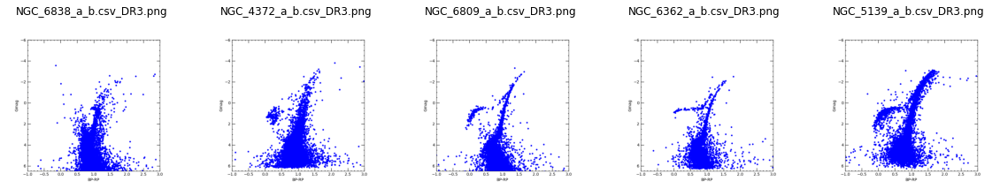

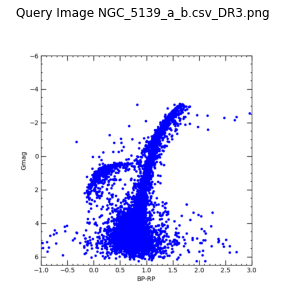

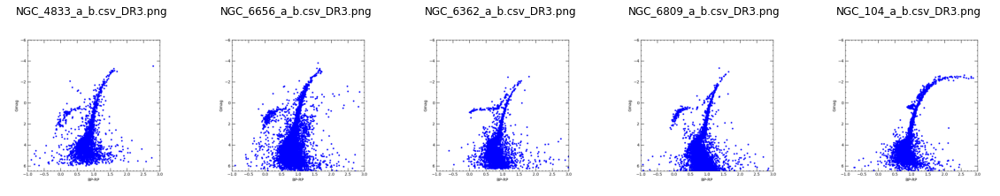

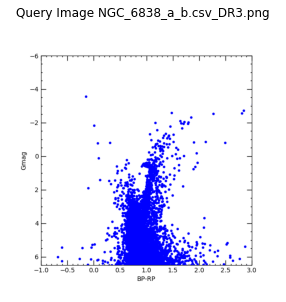

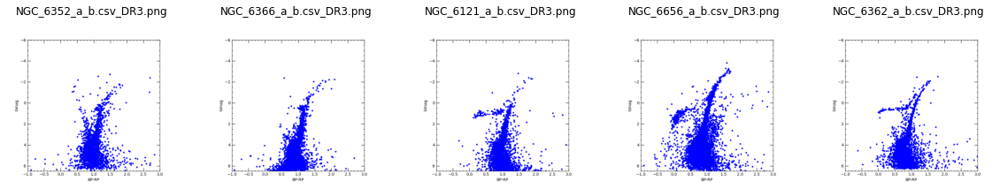

In [58]:
number =range (0, 56)#datapoint
for num in number:
    res = knn.kneighbors(data[num].reshape(1,-1),return_distance=True,n_neighbors=6)
    results_(num,list(res[1][0])[1:])
    


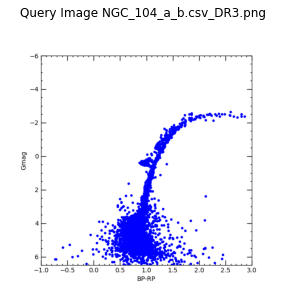

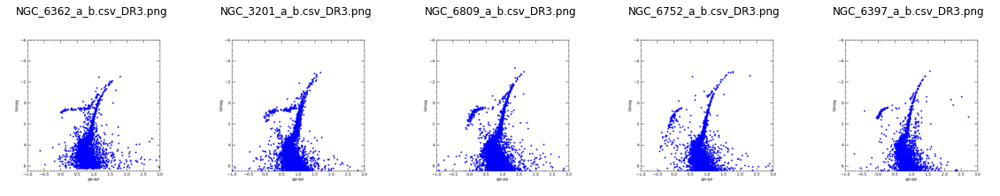

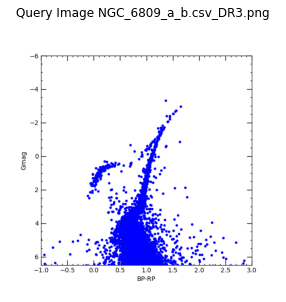

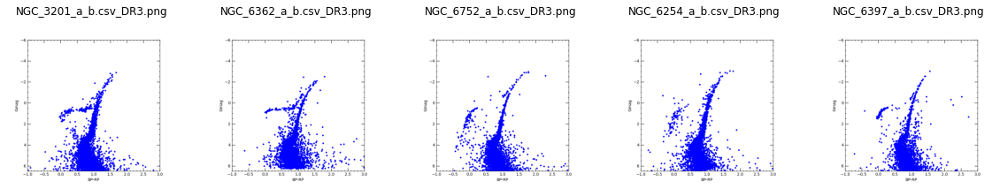

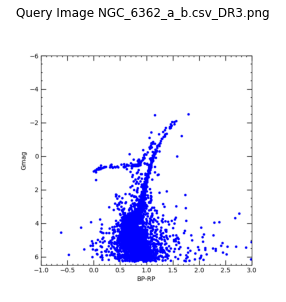

...

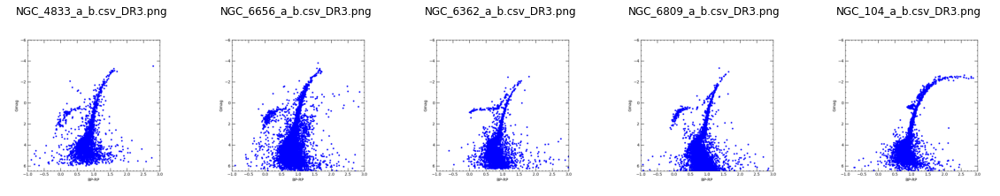

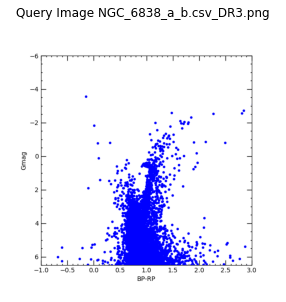

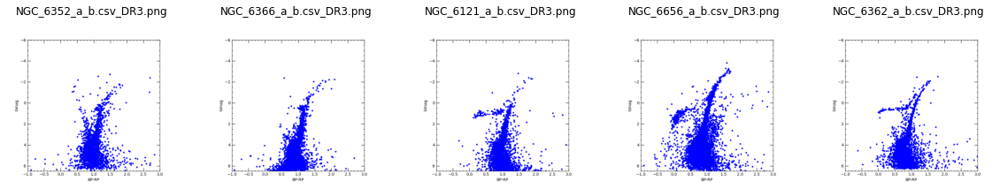

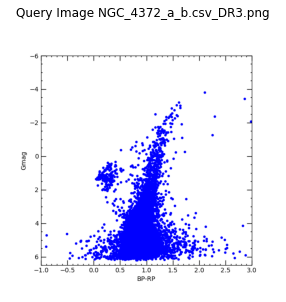

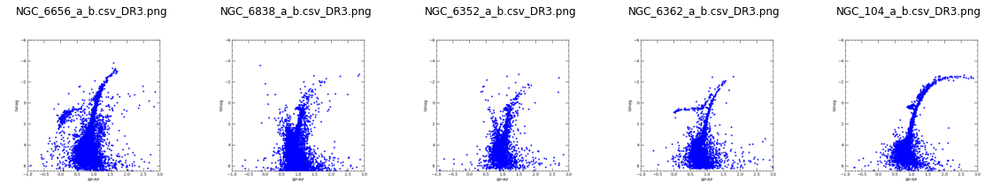

In [59]:
number =range (1, 57)#datapoint
for num in number:
    res = knn.kneighbors(data[num].reshape(1,-1),return_distance=True,n_neighbors=6)
    results_(num,list(res[1][0])[1:])
    

In [60]:
from PIL import Image
from numpy import asarray
import keras.backend as K
def predictions(label,N=5,isurl=False):
    if isurl:
        img = io.imread(label)
        img = cv2.resize(img,(224,224))
    else:
        img_path ='/Users/bishn/Desktop/ML/input_datasetsx/'
        img = Image.open(img_path + label)
        img = img.resize((224, 224))  # Resize the image


    img_data = np.array(img)
    img_data = np.expand_dims(img_data,axis=0)
    img_data = preprocess_input(img_data)
    input_tensor = model.layers[0].input
    output_tensor = model.layers[12].output
    get_output = K.function([input_tensor], [output_tensor])
    input_data = np.random.rand(1, 224, 224, 3) # example input data
    output_data = get_output([input_data])[0] # get output for input data
    feature = K.function([model.layers[0].input],[model.layers[12].output])
    feature = np.array(feature).flatten().reshape(1,-1)
    res = knn.kneighbors(feature.reshape(1,-1), return_distance=True, n_neighbors=int(N))
    results_(img,list(res[1][0])[1:])
    return 
#pwd = '/Users/bishn/Desktop/ML/input_datasetsx/'
query_path ='NGC_5904_a_b.csv_DR3.png'
predictions(query_path)
  

    


TypeError: float() argument must be a string or a number, not 'function'

In [ ]:
pwd = '/Users/bishn/Desktop/ML/input_datasetsx/'
query_path = pwd +  'NGC_104_roughcmd.png'
predictions(query_path)

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

model = load_model('path/to/model.h5')
knn = load_model('path/to/knn_model.h5')

def predictions(label, N=5, isurl=False):
    if isurl:
        # Assuming the io and PIL modules are imported elsewhere in the code
        img = Image.open(io.BytesIO(requests.get(label).content))
        img = img.resize((224, 224))
    else:
        img_path = "/Users/bishn/Desktop/ML/input_datasetsx/"
        img = image.load_img(img_path + label, target_size=(224, 224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)  # Assuming this function is defined elsewhere

    feature = K.function([model.layers[0].input], [model.layers[12].output])
    feature = np.array(feature(img_data)).flatten().reshape(1, -1)

    res = knn.kneighbors(feature, return_distance=True, n_neighbors=N)
    return results_(img, list(res[1][0])[1:])  # Assuming the results_ function is defined elsewhere

pwd = '/Users/bishn/Desktop/ML/input_datasetsx/'
query_path = pwd + 'NGC_104_roughcmd.png'
predictions(query_path)
